In [3]:
!nvidia-smi

Tue Mar 25 22:11:34 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             25W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
import os
HOME = os.getcwd()
print(HOME)

/kaggle/working


In [5]:
!pip install -q git+https://github.com/THU-MIG/yolov10.git

In [6]:
!pip install -q supervision roboflow

In [7]:
pip install --upgrade ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 22.1 MB/s eta 0:00:0000:01
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.1.34
    Uninstalling ultralytics-8.1.34:
      Successfully uninstalled ultralytics-8.1.34
Note: you may need to restart the kernel to use updated packages.


In [8]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt
!ls -lh {HOME}/weights

total 1.2G
-rw-r--r-- 1 root root  80M Mar 25 22:10 yolov10b.pt
-rw-r--r-- 1 root root  80M Mar 25 22:10 yolov10b.pt.1
-rw-r--r-- 1 root root  80M May 26  2024 yolov10b.pt.2
-rw-r--r-- 1 root root 100M Mar 25 22:10 yolov10l.pt
-rw-r--r-- 1 root root 100M Mar 25 22:10 yolov10l.pt.1
-rw-r--r-- 1 root root 100M May 26  2024 yolov10l.pt.2
-rw-r--r-- 1 root root  64M Mar 25 22:10 yolov10m.pt
-rw-r--r-- 1 root root  64M Mar 25 22:10 yolov10m.pt.1
-rw-r--r-- 1 root root  64M May 26  2024 yolov10m.pt.2
-rw-r--r-- 1 root root  11M Mar 25 22:10 yolov10n.pt
-rw-r--r-- 1 root root  11M Mar 25 22:10 yolov10n.pt.1
-rw-r--r-- 1 root root  11M May 26  2024 yolov10n.pt.2
-rw-r--r-- 1 root root  32M Mar 25 22:10 yolov10s.pt
-rw-r--r-- 1 root root  32M Mar 25 22:10 yolov10s.pt.1
-rw-r--r-- 1 root root  32M May 26  2024 yolov10s.pt.2
-rw-r--r-- 1 root root 123M Mar 25 22:10 yolov10x.pt
-rw-r--r-- 1 root root 123M Mar 25 22:10 yolov10x.pt.1
-rw-r--r-- 1 root root 123M May 26  2024 yolov10x.pt.2


In [9]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="jzSwnJSLa16yiXXfFpxk")
project = rf.workspace("trabalho-ia-1mqpa").project("ia-sevif")
version = project.version(3)
dataset = version.download("yolov8")



loading Roboflow workspace...
loading Roboflow project...


In [11]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [12]:
# Printar os caminhos antes de adicionar
!echo "test: ../test/images"
!echo "train: ../train/images"
!echo "val: ../valid/images"

# Modificar o arquivo conforme desejado
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml


test: ../test/images
train: ../train/images
val: ../valid/images


In [14]:
import os
os.environ["WANDB_MODE"] = "disabled"

!yolo task=detect mode=train epochs=100 batch=32 plots=True \
model={HOME}/weights/yolov10n.pt \
data={dataset.location}/data.yaml\
optimizer=AdamW lr0=0.00005

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.96 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/working/weights/yolov10n.pt, data=/kaggle/working/IA-3/data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybr

In [ ]:
!ls {HOME}/runs/detect/train/

In [ ]:
# Instalar Ultralytics.
from ultralytics import YOLO

# Carregar o modelo YOLOv10n.
model = YOLO( "/kaggle/working/runs/detect/train/weights/best.pt" )

# Exportar o modelo para o formato LiteRT (TF Lite).
model.export( format = "tflite" )

In [ ]:
import shutil

# Caminho da pasta que você quer compactar
pasta_origem = '/kaggle/working/runs/detect/train/weights/best_saved_model'

# Caminho de destino do arquivo compactado
arquivo_destino = '/kaggle/working/tetes'

# Compactando a pasta em um arquivo ZIP
shutil.make_archive(arquivo_destino, 'zip', pasta_origem)

print(f'Pasta compactada com sucesso em {arquivo_destino}.zip')


In [ ]:
import os
import zipfile
from ultralytics import YOLO
import cv2

# 1. Carregar o modelo pré-treinado YOLO
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')  # Modelo YOLOv8

# 2. Caminho da pasta contendo as imagens
input_folder_path = "/kaggle/working/IA-3/test/images"  # Substitua pelo caminho correto
output_folder_path = "/kaggle/working/processed_images"  # Pasta para salvar as imagens processadas

# 3. Criar a pasta de saída, se não existir
os.makedirs(output_folder_path, exist_ok=True)

# 4. Listar todas as imagens na pasta
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']  # Extensões de imagens suportadas
image_files = [f for f in os.listdir(input_folder_path) if os.path.splitext(f)[-1].lower() in image_extensions]

# 5. Processar cada imagem
for image_file in image_files:
    image_path = os.path.join(input_folder_path, image_file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Erro ao carregar a imagem: {image_path}")
        continue

    # Fazer inferência
    results = model(image, conf=0.2)  # Ajuste o limiar de confiança, se necessário

    # Desenhar as caixas sem nomes das classes
    annotated_image = image.copy()
    for result in results[0].boxes:
        box = result.xyxy[0]  # Coordenadas da caixa [x_min, y_min, x_max, y_max]
        x_min, y_min, x_max, y_max = map(int, box)

        # Desenhar apenas as caixas na imagem
        color = (0, 255, 0)  # Cor da caixa (verde)
        cv2.rectangle(annotated_image, (x_min, y_min), (x_max, y_max), color, 2)

    # Salvar a imagem anotada na pasta de saída
    output_image_path = os.path.join(output_folder_path, image_file)
    cv2.imwrite(output_image_path, annotated_image)

# 6. Compactar a pasta de saída em um arquivo ZIP
zip_file_path = "/kaggle/working/processed_images.zip"  # Caminho do arquivo ZIP
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    for root, dirs, files in os.walk(output_folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, output_folder_path)
            zipf.write(file_path, arcname)

print(f"Imagens processadas foram salvas e compactadas em: {zip_file_path}")



0: 640x640 7 leaf miners, 113.2ms
Speed: 2.2ms preprocess, 113.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


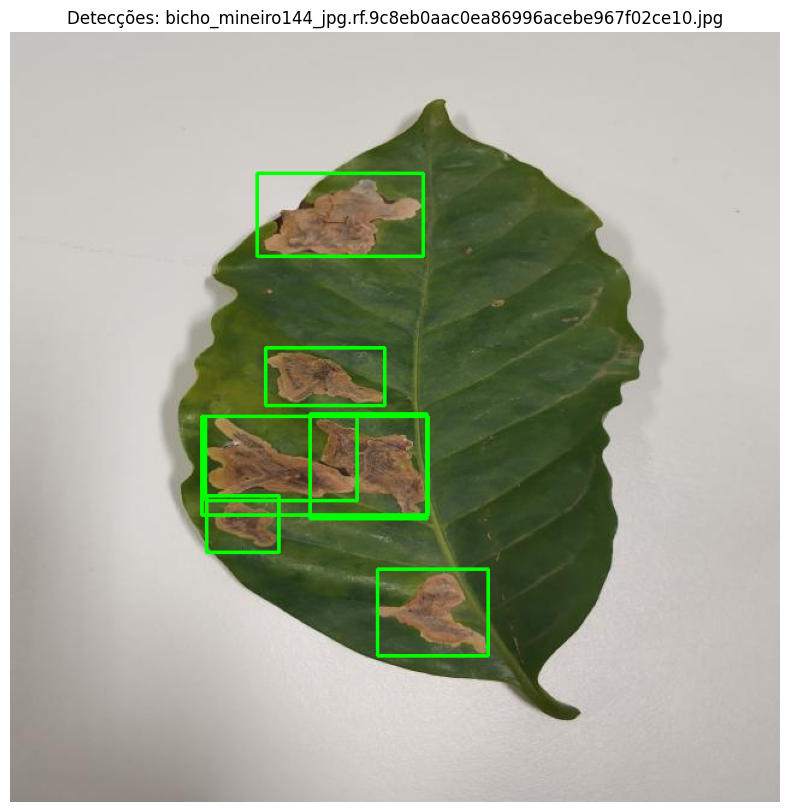


0: 640x640 14 leaf miners, 4 rusts, 112.3ms
Speed: 2.4ms preprocess, 112.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


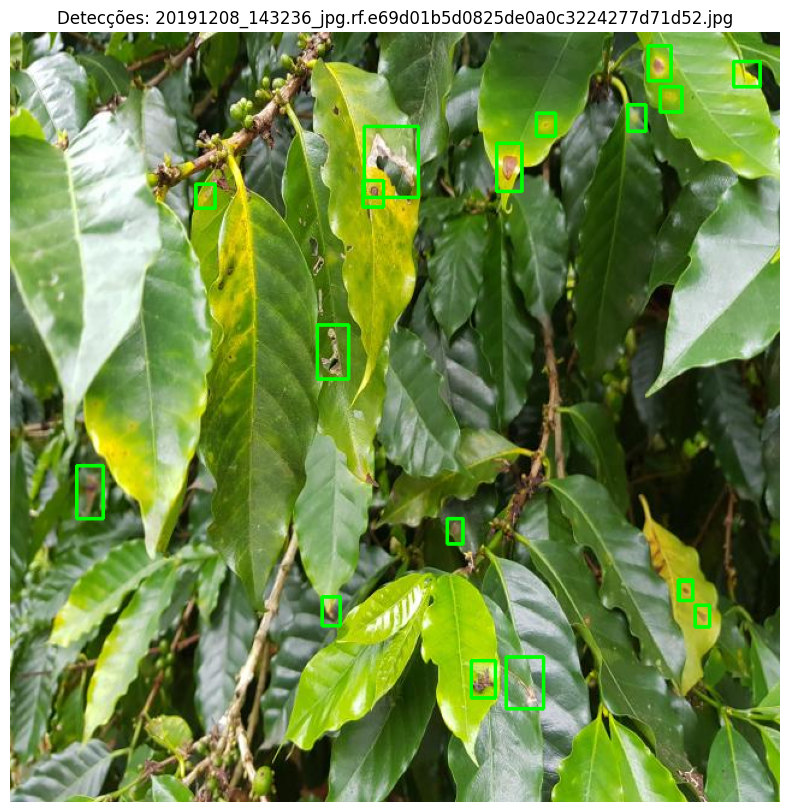


0: 640x640 5 rusts, 121.6ms
Speed: 1.9ms preprocess, 121.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


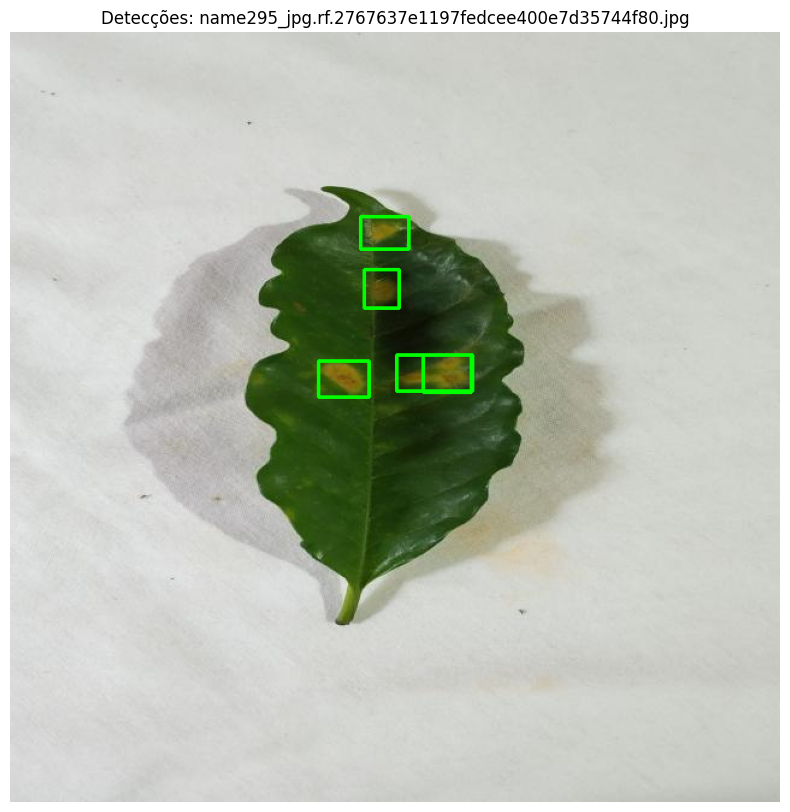


0: 640x640 3 leaf miners, 107.0ms
Speed: 2.3ms preprocess, 107.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


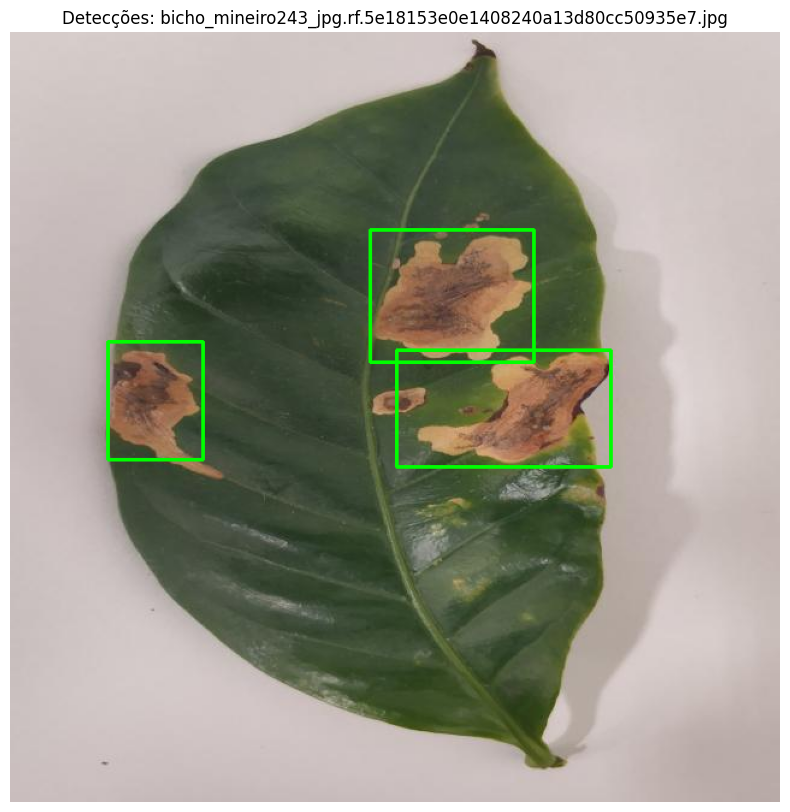


0: 640x640 3 rusts, 119.6ms
Speed: 2.0ms preprocess, 119.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


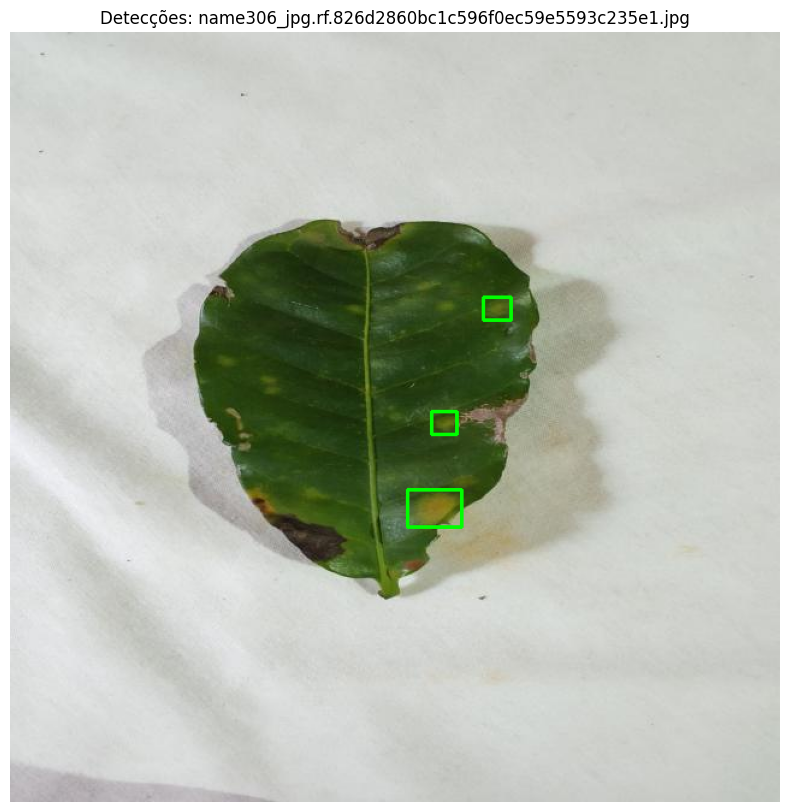


0: 640x640 16 leaf miners, 10 rusts, 114.2ms
Speed: 1.9ms preprocess, 114.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


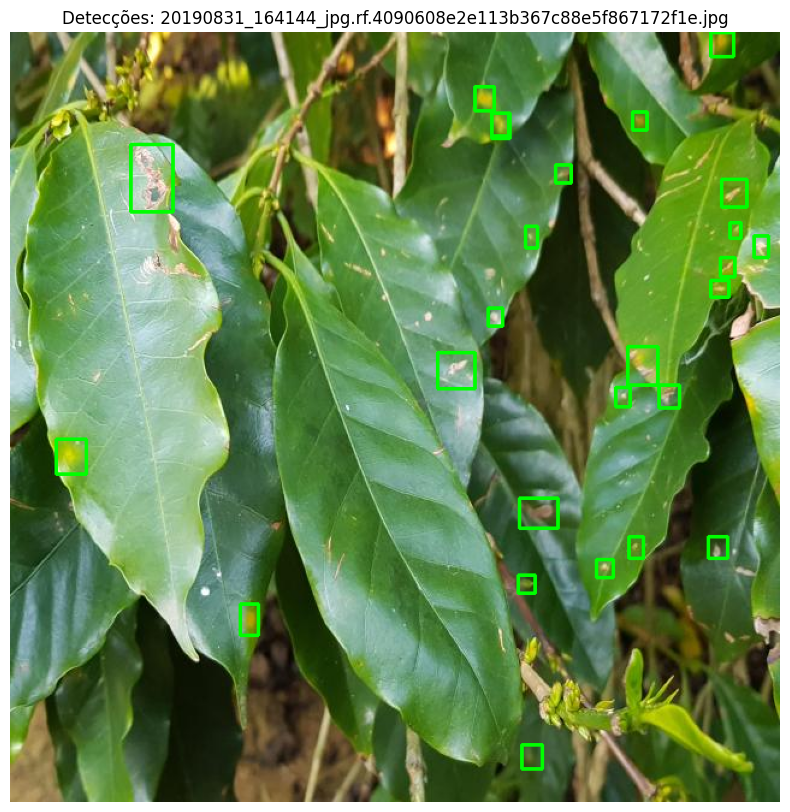


0: 640x640 7 leaf miners, 3 rusts, 116.0ms
Speed: 2.3ms preprocess, 116.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


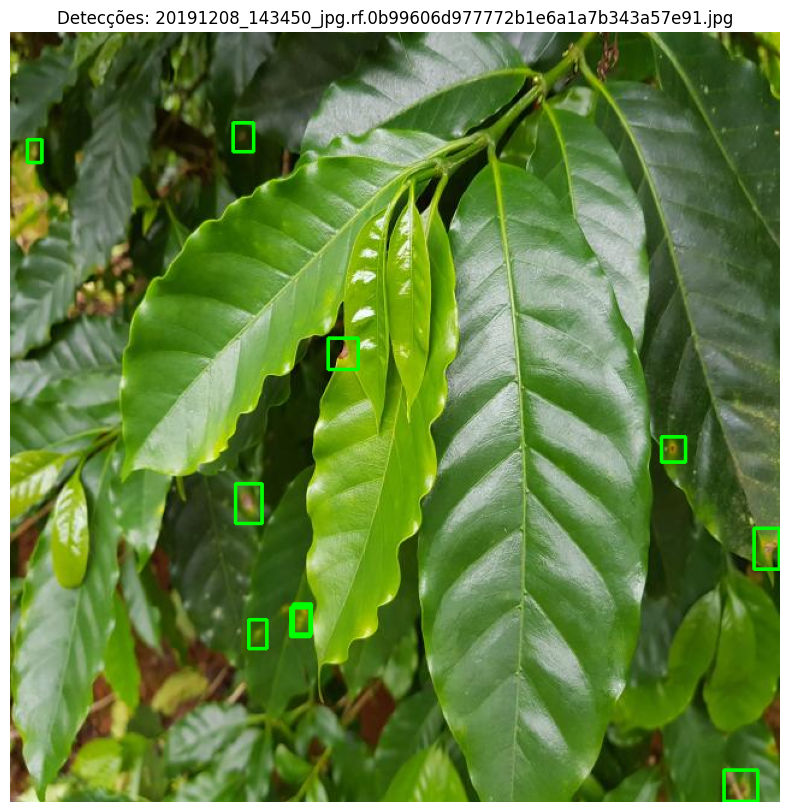


0: 640x640 5 rusts, 115.4ms
Speed: 1.9ms preprocess, 115.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


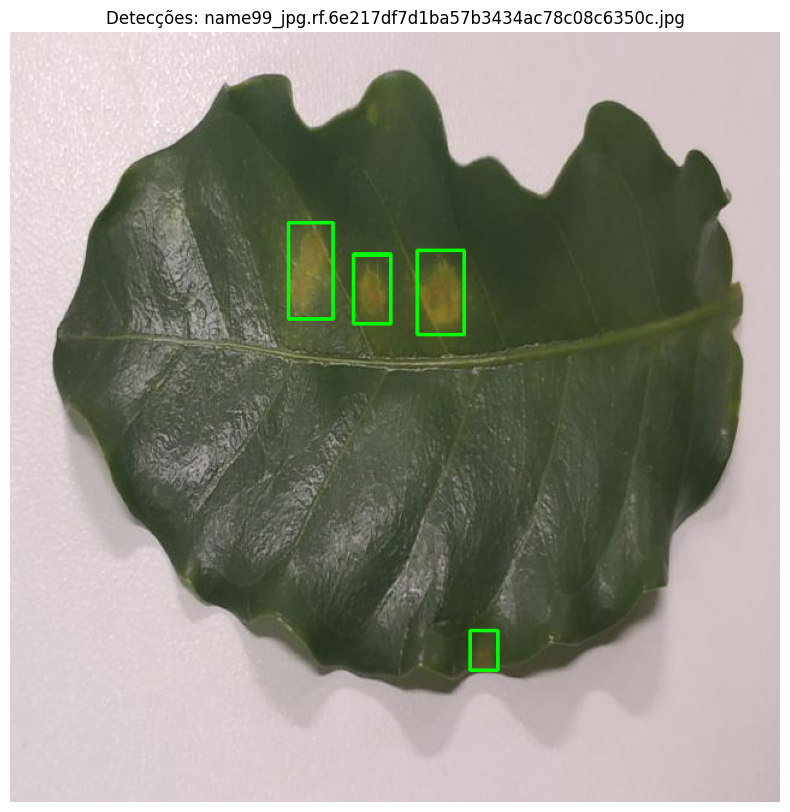


0: 640x640 5 leaf miners, 1 rust, 119.4ms
Speed: 2.0ms preprocess, 119.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


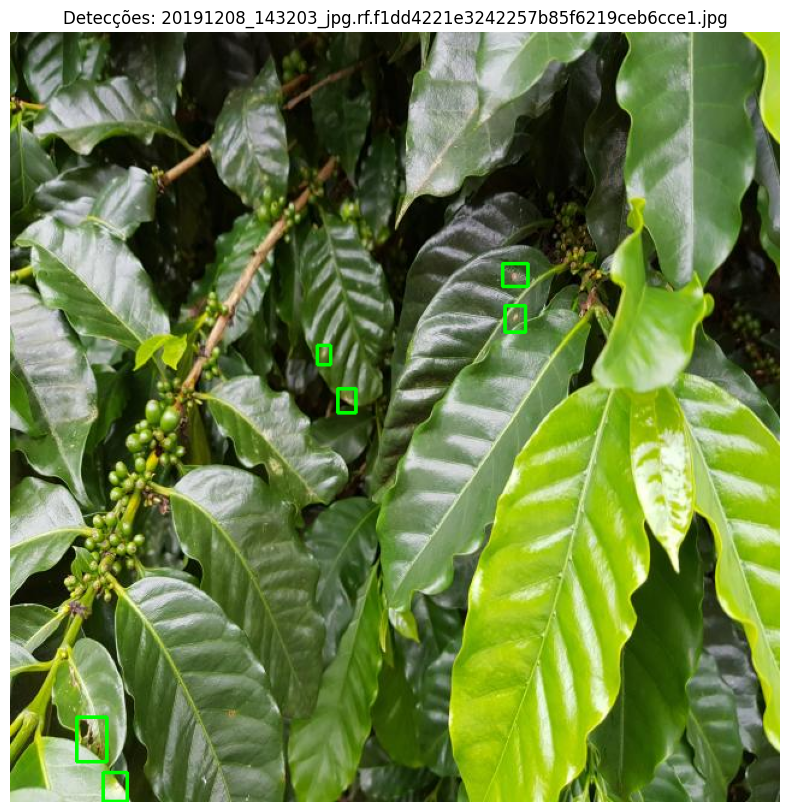


0: 640x640 9 rusts, 117.2ms
Speed: 1.9ms preprocess, 117.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


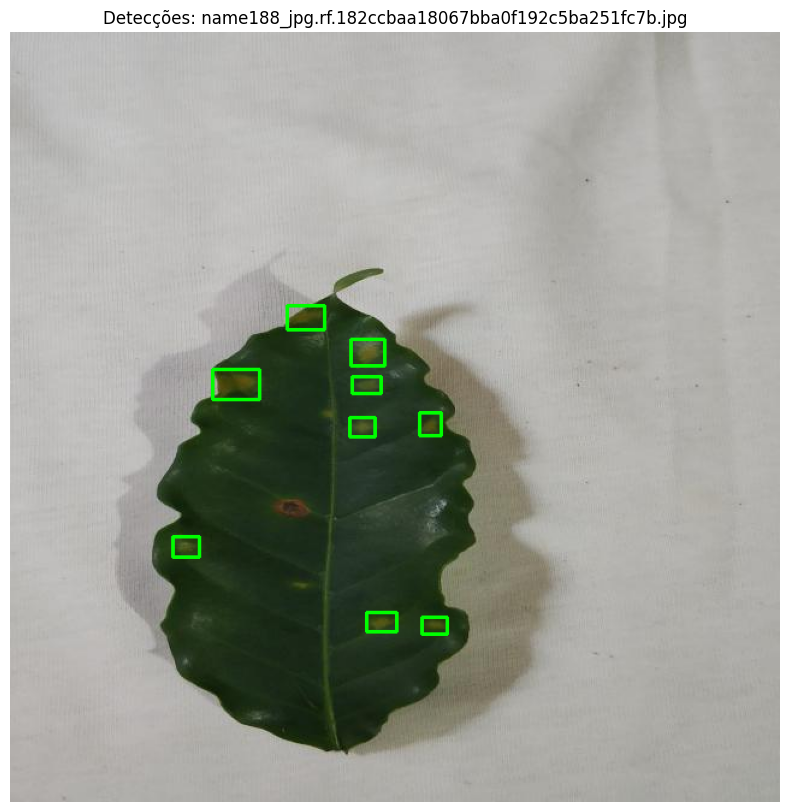


0: 640x640 6 leaf miners, 120.9ms
Speed: 1.8ms preprocess, 120.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


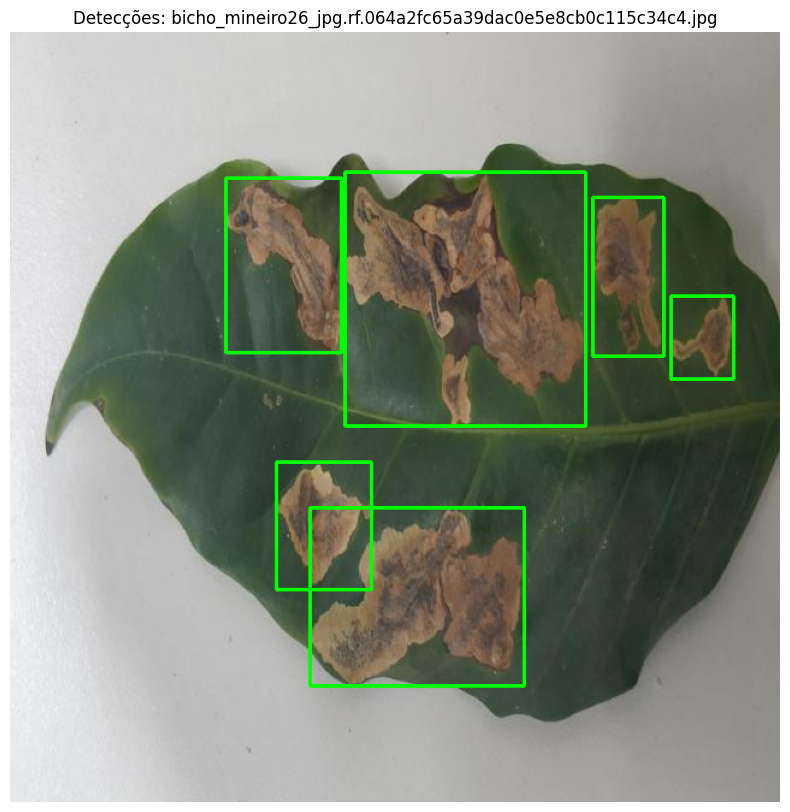


0: 640x640 26 leaf miners, 18 rusts, 113.4ms
Speed: 1.8ms preprocess, 113.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


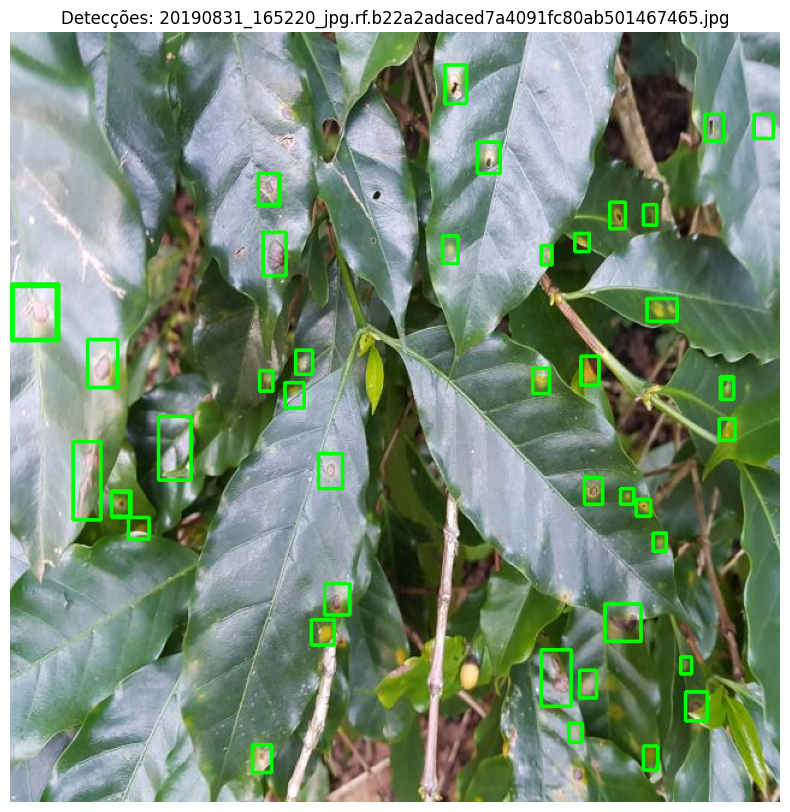


0: 640x640 14 leaf miners, 115.6ms
Speed: 2.0ms preprocess, 115.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


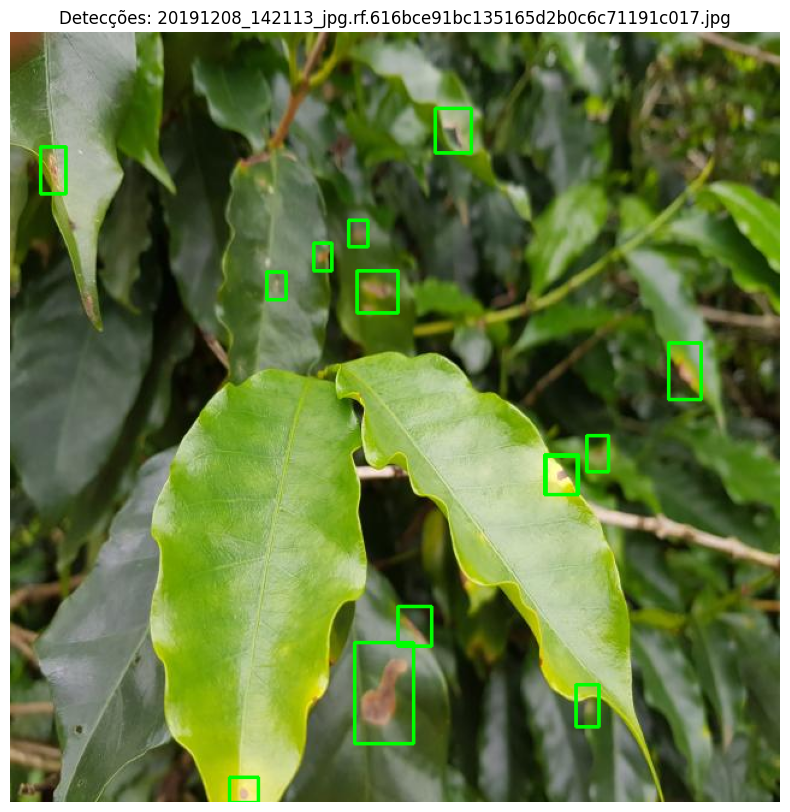


0: 640x640 4 rusts, 118.2ms
Speed: 1.8ms preprocess, 118.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


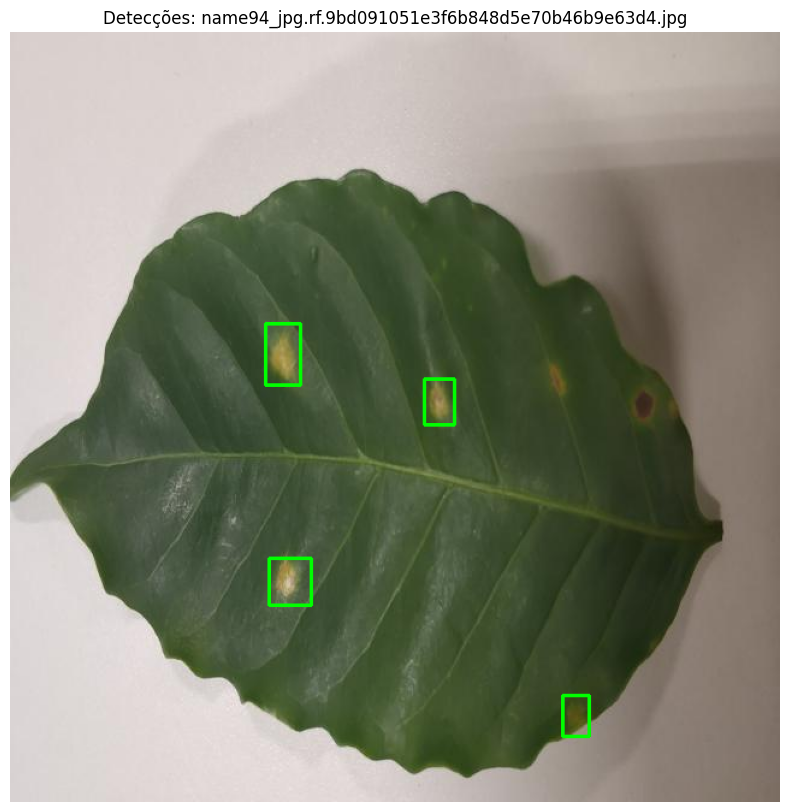


0: 640x640 4 leaf miners, 115.0ms
Speed: 2.1ms preprocess, 115.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


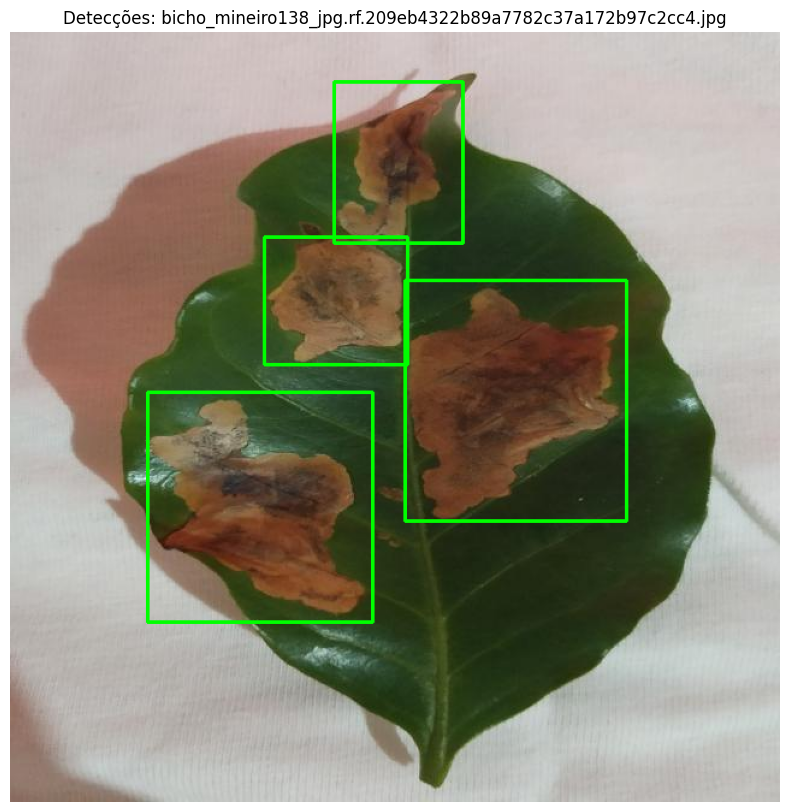


0: 640x640 25 leaf miners, 2 rusts, 131.4ms
Speed: 2.4ms preprocess, 131.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


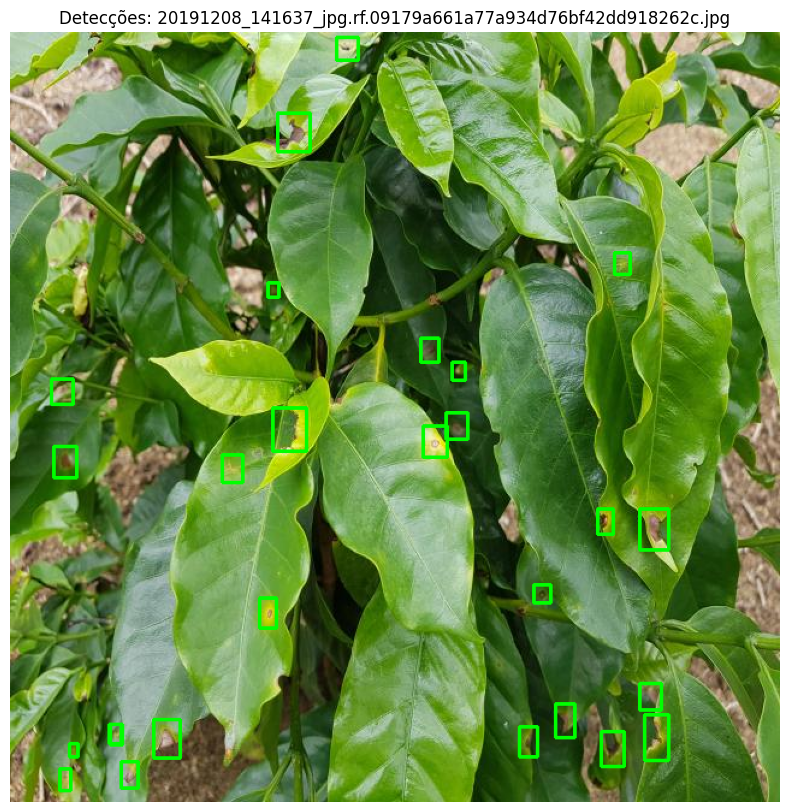


0: 640x640 11 leaf miners, 3 rusts, 120.4ms
Speed: 1.7ms preprocess, 120.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


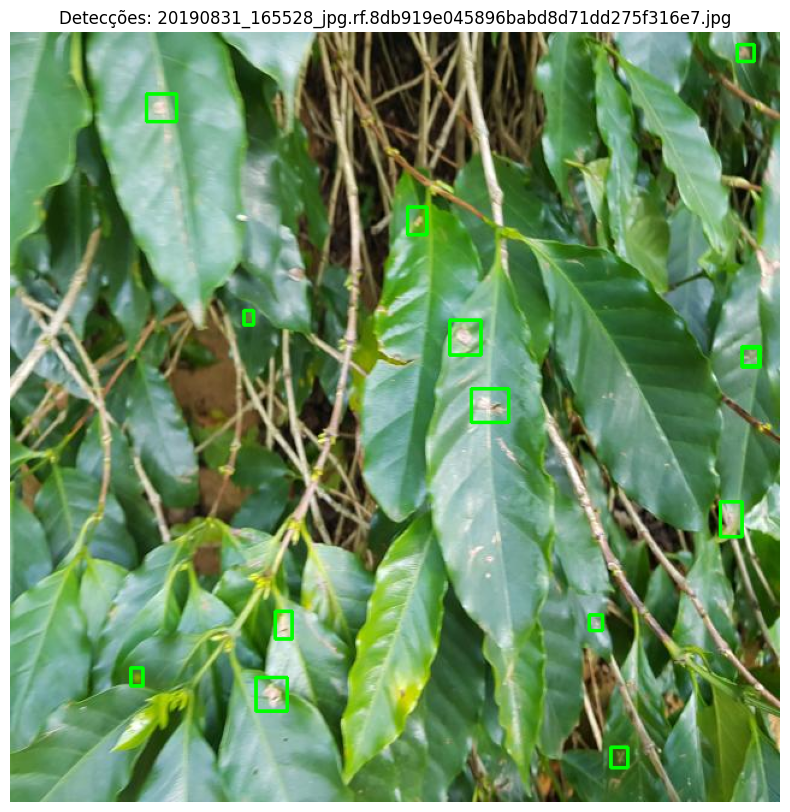


0: 640x640 5 leaf miners, 14 rusts, 114.2ms
Speed: 1.8ms preprocess, 114.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


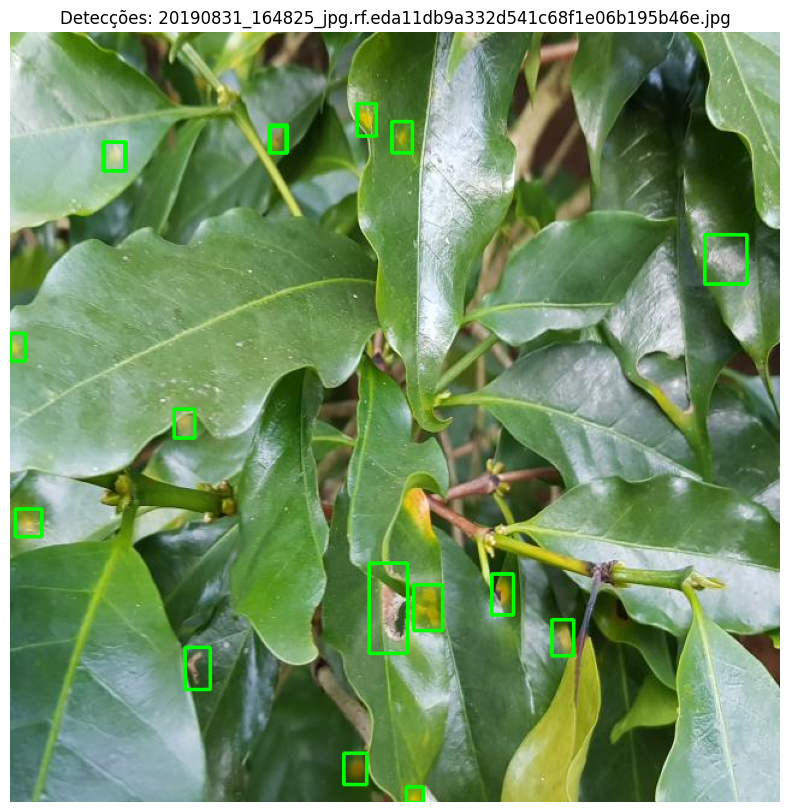


0: 640x640 28 leaf miners, 9 rusts, 115.8ms
Speed: 1.8ms preprocess, 115.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


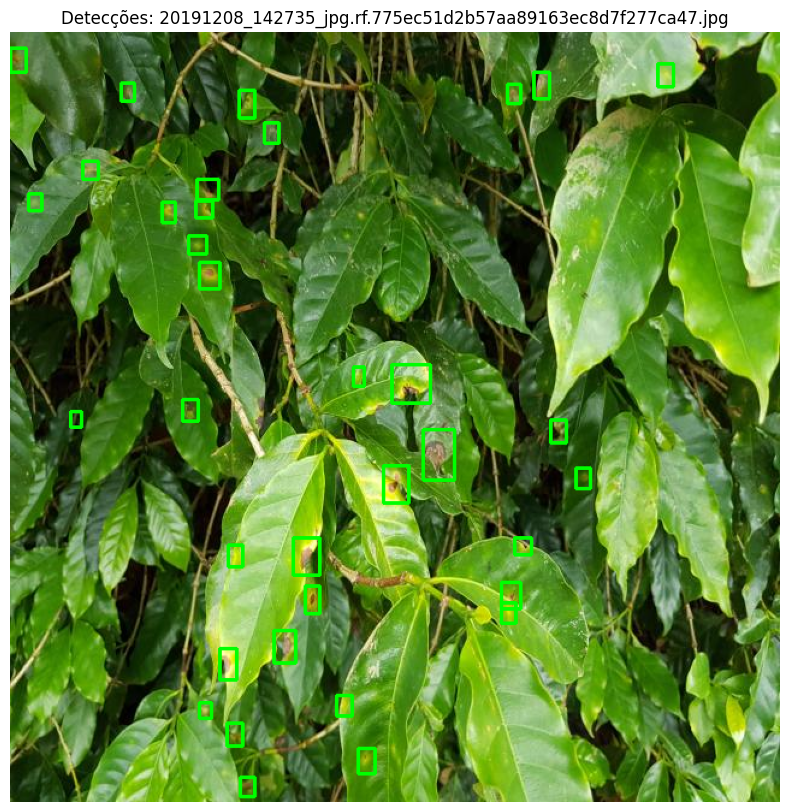


0: 640x640 7 leaf miners, 122.3ms
Speed: 1.8ms preprocess, 122.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


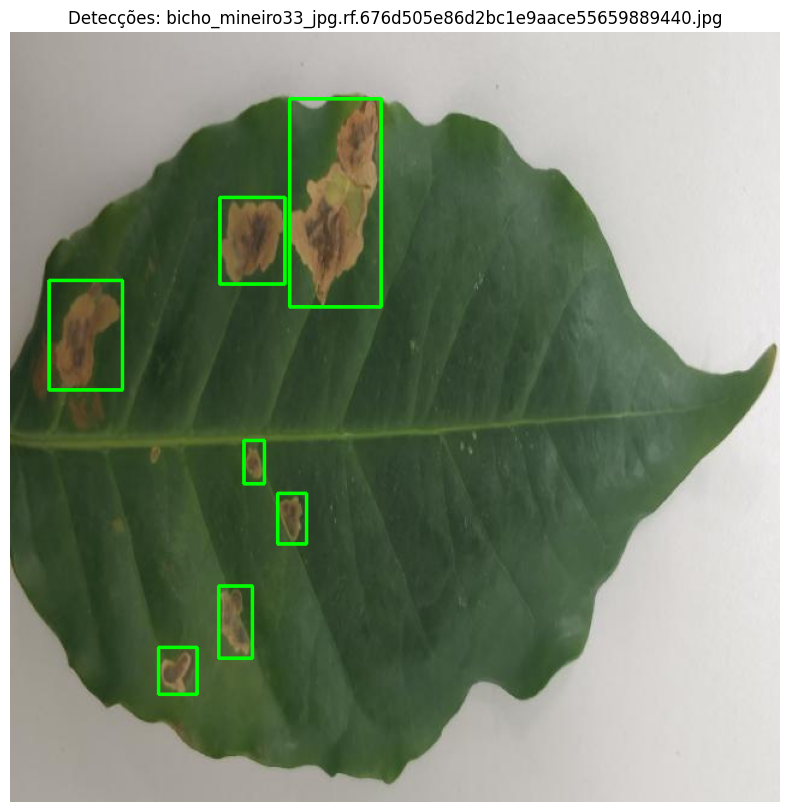


0: 640x640 4 rusts, 154.4ms
Speed: 2.5ms preprocess, 154.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


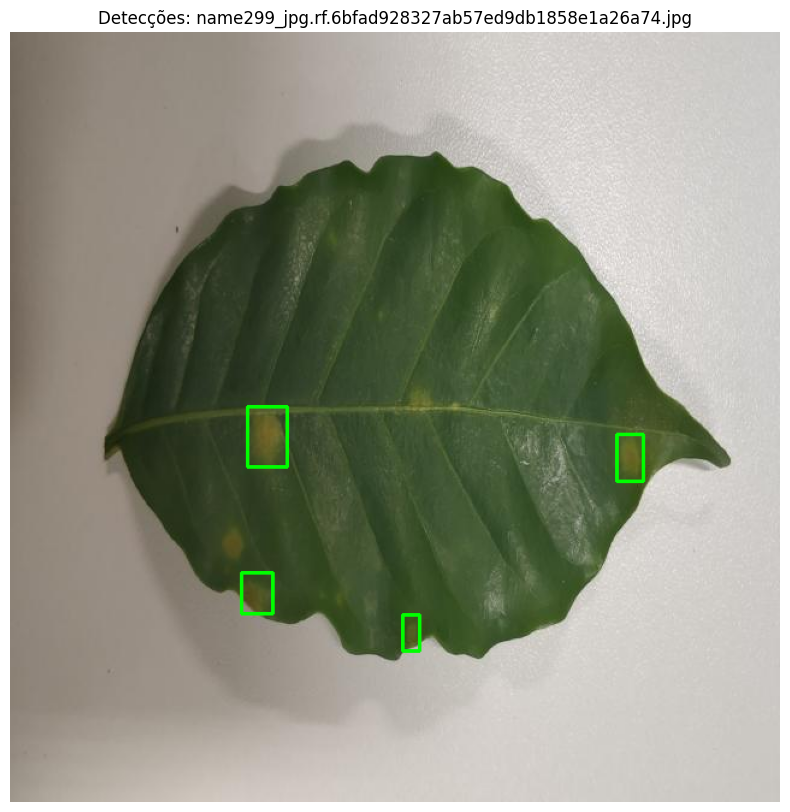

In [15]:
import os
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# 1. Carregar o modelo pré-treinado YOLO
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')  # Modelo YOLOv8

# 2. Caminho da pasta contendo as imagens
folder_path = "/kaggle/working/IA-3/test/images"  # Substitua pelo caminho correto

# 3. Listar todas as imagens na pasta
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']  # Extensões de imagens suportadas
image_files = [f for f in os.listdir(folder_path) if os.path.splitext(f)[-1].lower() in image_extensions]

# 4. Processar cada imagem
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Erro ao carregar a imagem: {image_path}")
        continue

    # 5. Fazer inferência
    results = model(image, conf=0.2)  # Ajuste o limiar de confiança, se necessário

    # 6. Desenhar as caixas sem nomes das classes
    annotated_image = image.copy()
    for result in results[0].boxes:
        box = result.xyxy[0]  # Coordenadas da caixa [x_min, y_min, x_max, y_max]
        x_min, y_min, x_max, y_max = map(int, box)

        # Desenhar apenas as caixas na imagem
        color = (0, 255, 0)  # Cor da caixa (verde)
        cv2.rectangle(annotated_image, (x_min, y_min), (x_max, y_max), color, 2)

    # 7. Mostrar a imagem sem nomes de classes
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))  # Converter para RGB antes de exibir
    plt.title(f"Detecções: {image_file}")
    plt.axis('off')
    plt.show()


In [16]:
pip install pyyaml


Note: you may need to restart the kernel to use updated packages.


In [17]:
import yaml

# Defina o caminho do arquivo YAML
yaml_file_path = "/kaggle/working/IA-3/data.yaml"

# Carregar o arquivo YAML
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Modificar os dados carregados (adicione ou altere os campos desejados)
data['test'] = '../test/images'
data['train'] = '../train/images'
data['val'] = '../test/images'

# Escrever as modificações de volta no arquivo YAML
with open(yaml_file_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f"Arquivo {yaml_file_path} atualizado com sucesso.")


Arquivo /kaggle/working/IA-3/data.yaml atualizado com sucesso.


In [18]:
!yolo mode=val model=/kaggle/working/runs/detect/train/weights/last.pt data=/kaggle/working/IA-3/data.yaml

Ultralytics 8.3.68 🚀 Python-3.10.14 torch-2.4.0 CPU (Intel Xeon 2.00GHz)
YOLOv10n summary (fused): 285 layers, 2,695,196 parameters, 0 gradients, 8.2 GFLOPs
val: Scanning /kaggle/working/IA-3/test/labels.cache... 21 images, 0 backgrounds
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 10, len(boxes) = 311. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all         21        311      0.457      0.419      0.332        0.1
            leaf miner         17        217      0.517      0.424      0.376      0.126
                  rust         13         94      0.397      0.415      0.287     0.0749
Speed: 4.0ms preprocess, 169.9ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https://d